This notebook compares the cross section of VALD3 Fe I with petitRadtran

author: Hiroyuki Tako ISHIKAWA

last update: November 11th (2021)

In [1]:
%load_ext autoreload
%autoreload 2
import numpy as np
from exojax.spec.lpf import auto_xsection, moldb, atomll
from exojax.spec.hitran import SijT, doppler_sigma
import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('bmh')

In [2]:
from exojax.utils.constants import m_u
H_He_HH_VMR = [0.0, 0.16, 0.84] #typical quasi-"solar-fraction"

In [3]:
path_pRT = '/home/tako/work/pRT/'

out_suffix = '_tmp211031'
outdir = path_pRT + 'input_data/opacities/lines/line_by_line/Fe_exojax/'
path_fig = '/home/tako/Dropbox/tmpfig/tmp_211031/'

# Compute atomic cross section from VALD3 
using exojax, then, convert the data to petitRADTRANS format  

written with reference to "[HITRAN_to_petitRadtran.ipynb](https://gist.github.com/HajimeKawahara/4d3e82621d28b035a6d70e7f7a4635ef)"

## set wavenumber range + load line lists

In [4]:
"""
    nus:  wavenumber range for which opacity will be calculated
    
    nus4LL:  wavenumber range of lines taken into account
    
    valdlines:  fullpath to the input line list obtained from VALD3 (http://vald.astro.uu.se/):
            VALD data access is free but requires registration through the Contact form (http://vald.astro.uu.se/~vald/php/vald.php?docpage=contact.html). After the registration, you can login and choose the "Extract Element" mode.
        For this notebook, the request form should be filled as:
            Starting wavelength :    1500
            Ending wavelength :    100000
            Element [ + ionization ] :    Fe 1
            Extraction format :    Long format
            Retrieve data via :    FTP
            Linelist configuration :    Default
            Unit selection:    Energy unit: eV - Medium: vacuum - Wavelength unit: angstrom - VdW syntax: default
        Please assign the fullpath of the output file sent by VALD ([user_name_at_VALD].[request_number_at_VALD].gz;  "vald2600.gz" in the code below) to the variable "valdlines".

"""

#nus = 1e8/np.arange(18000, 5000, -0.01, dtype=np.float64) #Covering whole wavelength ranges of Both IRD and CARMENES  
nus = 1e8/np.arange(12100, 11900, -0.01, dtype=np.float64) #Narrower portion
nus4LL = 1e8/np.arange(1e5, 1500.0, -0.01, dtype=np.float64) #Taking (almost(1e6->1e5)) all lines in the line lists (VALD3, Kurucz) into consideration  
valdlines = '/home/tako/work/VALD3/vald2600.gz'

adbFe = moldb.AdbVald(valdlines, nus4LL)#, Irwin=False, crit=1.e-100)
#adbFe = moldb.AdbKurucz(kuruczlines, nus4LL)

nu0=adbFe.nu_lines

Reading VALD file


## Assign species-specific variables


In [5]:
Amol=np.float64( adbFe.atomicmass[0] ) #atomic mass [u]
ionE=np.float64( adbFe.ionE[0] ) #ionization energy [eV]

## Set lists of temperature and pressure 
based on the ready-made grid in petitRADTRANS

In [6]:
Tarr = [81, 110, 148, 200, 270, 365, 493, 666, 900, 1215, 1641, 2000, 2217, 2500, 2750, 2995, 3250, 3500, 3750, 4000]
Parr = [0.000001, 0.000010, 0.000100, 0.001000, 0.010000, 0.100000, 1.000000, 10.000000, 100.000000, 1000.000000]
len(Tarr), len(Parr)

(20, 10)

## Compare opacity in each set of T & P

100%|███████████████████████████████████████████████████| 251/251 [00:13<00:00, 18.21it/s]
/tmp/ipykernel_291095/922208904.py:89: RuntimeWarning: divide by zero encountered in true_divide
  ratio = y1t/y2t_interp
/home/tako/miniconda3/lib/python3.9/site-packages/numpy/core/_methods.py:230: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


comp_diff_Fe_pRT_81.K_0.000001bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.46it/s]
/tmp/ipykernel_291095/922208904.py:89: RuntimeWarning: divide by zero encountered in true_divide
  ratio = y1t/y2t_interp
/home/tako/miniconda3/lib/python3.9/site-packages/numpy/core/_methods.py:230: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


comp_diff_Fe_pRT_81.K_0.000010bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.69it/s]
/tmp/ipykernel_291095/922208904.py:89: RuntimeWarning: divide by zero encountered in true_divide
  ratio = y1t/y2t_interp
/home/tako/miniconda3/lib/python3.9/site-packages/numpy/core/_methods.py:230: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


comp_diff_Fe_pRT_81.K_0.000100bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.46it/s]
/tmp/ipykernel_291095/922208904.py:89: RuntimeWarning: divide by zero encountered in true_divide
  ratio = y1t/y2t_interp
/home/tako/miniconda3/lib/python3.9/site-packages/numpy/core/_methods.py:230: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


comp_diff_Fe_pRT_81.K_0.001000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.48it/s]
/tmp/ipykernel_291095/922208904.py:89: RuntimeWarning: divide by zero encountered in true_divide
  ratio = y1t/y2t_interp
/home/tako/miniconda3/lib/python3.9/site-packages/numpy/core/_methods.py:230: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


comp_diff_Fe_pRT_81.K_0.010000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.55it/s]
/tmp/ipykernel_291095/922208904.py:89: RuntimeWarning: divide by zero encountered in true_divide
  ratio = y1t/y2t_interp
/home/tako/miniconda3/lib/python3.9/site-packages/numpy/core/_methods.py:230: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


comp_diff_Fe_pRT_81.K_0.100000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.52it/s]
/tmp/ipykernel_291095/922208904.py:89: RuntimeWarning: divide by zero encountered in true_divide
  ratio = y1t/y2t_interp
/home/tako/miniconda3/lib/python3.9/site-packages/numpy/core/_methods.py:230: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


comp_diff_Fe_pRT_81.K_1.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:13<00:00, 19.19it/s]
/tmp/ipykernel_291095/922208904.py:89: RuntimeWarning: divide by zero encountered in true_divide
  ratio = y1t/y2t_interp
/home/tako/miniconda3/lib/python3.9/site-packages/numpy/core/_methods.py:230: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


comp_diff_Fe_pRT_81.K_10.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.43it/s]
/tmp/ipykernel_291095/922208904.py:89: RuntimeWarning: divide by zero encountered in true_divide
  ratio = y1t/y2t_interp
/home/tako/miniconda3/lib/python3.9/site-packages/numpy/core/_methods.py:230: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


comp_diff_Fe_pRT_81.K_100.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:13<00:00, 19.23it/s]
/tmp/ipykernel_291095/922208904.py:89: RuntimeWarning: divide by zero encountered in true_divide
  ratio = y1t/y2t_interp
/home/tako/miniconda3/lib/python3.9/site-packages/numpy/core/_methods.py:230: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


comp_diff_Fe_pRT_81.K_1000.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.54it/s]


comp_diff_Fe_pRT_110.K_0.000001bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.62it/s]


comp_diff_Fe_pRT_110.K_0.000010bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:13<00:00, 19.29it/s]


comp_diff_Fe_pRT_110.K_0.000100bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.56it/s]


comp_diff_Fe_pRT_110.K_0.001000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.34it/s]


comp_diff_Fe_pRT_110.K_0.010000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.39it/s]


comp_diff_Fe_pRT_110.K_0.100000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:13<00:00, 19.10it/s]


comp_diff_Fe_pRT_110.K_1.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:13<00:00, 19.00it/s]


comp_diff_Fe_pRT_110.K_10.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.33it/s]


comp_diff_Fe_pRT_110.K_100.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.57it/s]


comp_diff_Fe_pRT_110.K_1000.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.47it/s]
/tmp/ipykernel_291095/922208904.py:65: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(9, 5))


comp_diff_Fe_pRT_148.K_0.000001bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.75it/s]


comp_diff_Fe_pRT_148.K_0.000010bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.39it/s]


comp_diff_Fe_pRT_148.K_0.000100bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.47it/s]


comp_diff_Fe_pRT_148.K_0.001000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.46it/s]


comp_diff_Fe_pRT_148.K_0.010000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.34it/s]


comp_diff_Fe_pRT_148.K_0.100000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:13<00:00, 19.28it/s]


comp_diff_Fe_pRT_148.K_1.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 20.15it/s]


comp_diff_Fe_pRT_148.K_10.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.36it/s]


comp_diff_Fe_pRT_148.K_100.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.61it/s]


comp_diff_Fe_pRT_148.K_1000.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.34it/s]


comp_diff_Fe_pRT_200.K_0.000001bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.63it/s]


comp_diff_Fe_pRT_200.K_0.000010bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.69it/s]


comp_diff_Fe_pRT_200.K_0.000100bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.76it/s]


comp_diff_Fe_pRT_200.K_0.001000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.46it/s]


comp_diff_Fe_pRT_200.K_0.010000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.48it/s]


comp_diff_Fe_pRT_200.K_0.100000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.39it/s]


comp_diff_Fe_pRT_200.K_1.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.40it/s]


comp_diff_Fe_pRT_200.K_10.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.56it/s]


comp_diff_Fe_pRT_200.K_100.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.54it/s]


comp_diff_Fe_pRT_200.K_1000.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.64it/s]


comp_diff_Fe_pRT_270.K_0.000001bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.75it/s]


comp_diff_Fe_pRT_270.K_0.000010bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.50it/s]


comp_diff_Fe_pRT_270.K_0.000100bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.61it/s]


comp_diff_Fe_pRT_270.K_0.001000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.34it/s]


comp_diff_Fe_pRT_270.K_0.010000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.36it/s]


comp_diff_Fe_pRT_270.K_0.100000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.55it/s]


comp_diff_Fe_pRT_270.K_1.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.50it/s]


comp_diff_Fe_pRT_270.K_10.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.47it/s]


comp_diff_Fe_pRT_270.K_100.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:13<00:00, 18.89it/s]


comp_diff_Fe_pRT_270.K_1000.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:13<00:00, 19.22it/s]


comp_diff_Fe_pRT_365.K_0.000001bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.82it/s]


comp_diff_Fe_pRT_365.K_0.000010bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.69it/s]


comp_diff_Fe_pRT_365.K_0.000100bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.49it/s]


comp_diff_Fe_pRT_365.K_0.001000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.34it/s]


comp_diff_Fe_pRT_365.K_0.010000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.50it/s]


comp_diff_Fe_pRT_365.K_0.100000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:13<00:00, 19.17it/s]


comp_diff_Fe_pRT_365.K_1.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.51it/s]


comp_diff_Fe_pRT_365.K_10.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.37it/s]


comp_diff_Fe_pRT_365.K_100.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.68it/s]


comp_diff_Fe_pRT_365.K_1000.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.53it/s]


comp_diff_Fe_pRT_493.K_0.000001bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.86it/s]


comp_diff_Fe_pRT_493.K_0.000010bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.69it/s]


comp_diff_Fe_pRT_493.K_0.000100bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.53it/s]


comp_diff_Fe_pRT_493.K_0.001000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.53it/s]


comp_diff_Fe_pRT_493.K_0.010000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:13<00:00, 19.12it/s]


comp_diff_Fe_pRT_493.K_0.100000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.43it/s]


comp_diff_Fe_pRT_493.K_1.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:13<00:00, 19.14it/s]


comp_diff_Fe_pRT_493.K_10.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.53it/s]


comp_diff_Fe_pRT_493.K_100.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:13<00:00, 19.15it/s]


comp_diff_Fe_pRT_493.K_1000.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.84it/s]


comp_diff_Fe_pRT_666.K_0.000001bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.69it/s]


comp_diff_Fe_pRT_666.K_0.000010bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.94it/s]


comp_diff_Fe_pRT_666.K_0.000100bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.57it/s]


comp_diff_Fe_pRT_666.K_0.001000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.55it/s]


comp_diff_Fe_pRT_666.K_0.010000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.67it/s]


comp_diff_Fe_pRT_666.K_0.100000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.41it/s]


comp_diff_Fe_pRT_666.K_1.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:13<00:00, 19.08it/s]


comp_diff_Fe_pRT_666.K_10.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:13<00:00, 19.13it/s]


comp_diff_Fe_pRT_666.K_100.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.43it/s]


comp_diff_Fe_pRT_666.K_1000.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.72it/s]


comp_diff_Fe_pRT_900.K_0.000001bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.64it/s]


comp_diff_Fe_pRT_900.K_0.000010bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.70it/s]


comp_diff_Fe_pRT_900.K_0.000100bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.58it/s]


comp_diff_Fe_pRT_900.K_0.001000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:13<00:00, 19.30it/s]


comp_diff_Fe_pRT_900.K_0.010000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.42it/s]


comp_diff_Fe_pRT_900.K_0.100000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.47it/s]


comp_diff_Fe_pRT_900.K_1.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:13<00:00, 19.22it/s]


comp_diff_Fe_pRT_900.K_10.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.37it/s]


comp_diff_Fe_pRT_900.K_100.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:13<00:00, 19.23it/s]


comp_diff_Fe_pRT_900.K_1000.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.68it/s]


comp_diff_Fe_pRT_1215.K_0.000001bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.45it/s]


comp_diff_Fe_pRT_1215.K_0.000010bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:13<00:00, 19.31it/s]


comp_diff_Fe_pRT_1215.K_0.000100bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.65it/s]


comp_diff_Fe_pRT_1215.K_0.001000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.45it/s]


comp_diff_Fe_pRT_1215.K_0.010000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:13<00:00, 19.13it/s]


comp_diff_Fe_pRT_1215.K_0.100000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:13<00:00, 19.03it/s]


comp_diff_Fe_pRT_1215.K_1.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.37it/s]


comp_diff_Fe_pRT_1215.K_10.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:13<00:00, 19.04it/s]


comp_diff_Fe_pRT_1215.K_100.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:13<00:00, 19.09it/s]


comp_diff_Fe_pRT_1215.K_1000.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 20.03it/s]


comp_diff_Fe_pRT_1641.K_0.000001bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.98it/s]


comp_diff_Fe_pRT_1641.K_0.000010bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.81it/s]


comp_diff_Fe_pRT_1641.K_0.000100bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.95it/s]


comp_diff_Fe_pRT_1641.K_0.001000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.53it/s]


comp_diff_Fe_pRT_1641.K_0.010000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.52it/s]


comp_diff_Fe_pRT_1641.K_0.100000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:13<00:00, 19.17it/s]


comp_diff_Fe_pRT_1641.K_1.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:13<00:00, 19.17it/s]


comp_diff_Fe_pRT_1641.K_10.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.37it/s]


comp_diff_Fe_pRT_1641.K_100.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:13<00:00, 19.26it/s]


comp_diff_Fe_pRT_1641.K_1000.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.46it/s]


comp_diff_Fe_pRT_2000.K_0.000001bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.77it/s]


comp_diff_Fe_pRT_2000.K_0.000010bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.98it/s]


comp_diff_Fe_pRT_2000.K_0.000100bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 20.17it/s]


comp_diff_Fe_pRT_2000.K_0.001000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.84it/s]


comp_diff_Fe_pRT_2000.K_0.010000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.88it/s]


comp_diff_Fe_pRT_2000.K_0.100000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.41it/s]


comp_diff_Fe_pRT_2000.K_1.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.55it/s]


comp_diff_Fe_pRT_2000.K_10.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.69it/s]


comp_diff_Fe_pRT_2000.K_100.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.57it/s]


comp_diff_Fe_pRT_2000.K_1000.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 20.08it/s]


comp_diff_Fe_pRT_2217.K_0.000001bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.52it/s]


comp_diff_Fe_pRT_2217.K_0.000010bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:13<00:00, 18.74it/s]


comp_diff_Fe_pRT_2217.K_0.000100bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:13<00:00, 18.90it/s]


comp_diff_Fe_pRT_2217.K_0.001000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.64it/s]


comp_diff_Fe_pRT_2217.K_0.010000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.56it/s]


comp_diff_Fe_pRT_2217.K_0.100000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.37it/s]


comp_diff_Fe_pRT_2217.K_1.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:13<00:00, 19.21it/s]


comp_diff_Fe_pRT_2217.K_10.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.64it/s]


comp_diff_Fe_pRT_2217.K_100.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:13<00:00, 19.21it/s]


comp_diff_Fe_pRT_2217.K_1000.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.61it/s]


comp_diff_Fe_pRT_2500.K_0.000001bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:11<00:00, 20.98it/s]


comp_diff_Fe_pRT_2500.K_0.000010bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.95it/s]


comp_diff_Fe_pRT_2500.K_0.000100bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:11<00:00, 21.32it/s]


comp_diff_Fe_pRT_2500.K_0.001000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.57it/s]


comp_diff_Fe_pRT_2500.K_0.010000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:11<00:00, 21.16it/s]


comp_diff_Fe_pRT_2500.K_0.100000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:13<00:00, 19.18it/s]


comp_diff_Fe_pRT_2500.K_1.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 20.43it/s]


comp_diff_Fe_pRT_2500.K_10.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.58it/s]


comp_diff_Fe_pRT_2500.K_100.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.56it/s]


comp_diff_Fe_pRT_2500.K_1000.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:11<00:00, 21.48it/s]


comp_diff_Fe_pRT_2750.K_0.000001bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.60it/s]


comp_diff_Fe_pRT_2750.K_0.000010bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.73it/s]


comp_diff_Fe_pRT_2750.K_0.000100bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.83it/s]


comp_diff_Fe_pRT_2750.K_0.001000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.60it/s]


comp_diff_Fe_pRT_2750.K_0.010000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.74it/s]


comp_diff_Fe_pRT_2750.K_0.100000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.52it/s]


comp_diff_Fe_pRT_2750.K_1.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:13<00:00, 19.14it/s]


comp_diff_Fe_pRT_2750.K_10.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.52it/s]


comp_diff_Fe_pRT_2750.K_100.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.39it/s]


comp_diff_Fe_pRT_2750.K_1000.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.84it/s]


comp_diff_Fe_pRT_2995.K_0.000001bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.92it/s]


comp_diff_Fe_pRT_2995.K_0.000010bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.40it/s]


comp_diff_Fe_pRT_2995.K_0.000100bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.95it/s]


comp_diff_Fe_pRT_2995.K_0.001000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.84it/s]


comp_diff_Fe_pRT_2995.K_0.010000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.64it/s]


comp_diff_Fe_pRT_2995.K_0.100000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.35it/s]


comp_diff_Fe_pRT_2995.K_1.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:13<00:00, 19.24it/s]


comp_diff_Fe_pRT_2995.K_10.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.35it/s]


comp_diff_Fe_pRT_2995.K_100.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:13<00:00, 19.18it/s]


comp_diff_Fe_pRT_2995.K_1000.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.49it/s]


comp_diff_Fe_pRT_3250.K_0.000001bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 20.21it/s]


comp_diff_Fe_pRT_3250.K_0.000010bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.90it/s]


comp_diff_Fe_pRT_3250.K_0.000100bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.91it/s]


comp_diff_Fe_pRT_3250.K_0.001000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.68it/s]


comp_diff_Fe_pRT_3250.K_0.010000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.69it/s]


comp_diff_Fe_pRT_3250.K_0.100000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.41it/s]


comp_diff_Fe_pRT_3250.K_1.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:13<00:00, 19.30it/s]


comp_diff_Fe_pRT_3250.K_10.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.34it/s]


comp_diff_Fe_pRT_3250.K_100.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:13<00:00, 19.19it/s]


comp_diff_Fe_pRT_3250.K_1000.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.90it/s]


comp_diff_Fe_pRT_3500.K_0.000001bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.95it/s]


comp_diff_Fe_pRT_3500.K_0.000010bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.68it/s]


comp_diff_Fe_pRT_3500.K_0.000100bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.45it/s]


comp_diff_Fe_pRT_3500.K_0.001000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.76it/s]


comp_diff_Fe_pRT_3500.K_0.010000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.65it/s]


comp_diff_Fe_pRT_3500.K_0.100000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.34it/s]


comp_diff_Fe_pRT_3500.K_1.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:13<00:00, 19.18it/s]


comp_diff_Fe_pRT_3500.K_10.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.41it/s]


comp_diff_Fe_pRT_3500.K_100.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:13<00:00, 19.30it/s]


comp_diff_Fe_pRT_3500.K_1000.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.70it/s]


comp_diff_Fe_pRT_3750.K_0.000001bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 20.03it/s]


comp_diff_Fe_pRT_3750.K_0.000010bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.66it/s]


comp_diff_Fe_pRT_3750.K_0.000100bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.85it/s]


comp_diff_Fe_pRT_3750.K_0.001000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.45it/s]


comp_diff_Fe_pRT_3750.K_0.010000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 20.01it/s]


comp_diff_Fe_pRT_3750.K_0.100000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.51it/s]


comp_diff_Fe_pRT_3750.K_1.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.44it/s]


comp_diff_Fe_pRT_3750.K_10.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:13<00:00, 19.19it/s]


comp_diff_Fe_pRT_3750.K_100.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:13<00:00, 19.07it/s]


comp_diff_Fe_pRT_3750.K_1000.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.53it/s]


comp_diff_Fe_pRT_4000.K_0.000001bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.72it/s]


comp_diff_Fe_pRT_4000.K_0.000010bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:11<00:00, 21.35it/s]


comp_diff_Fe_pRT_4000.K_0.000100bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.91it/s]


comp_diff_Fe_pRT_4000.K_0.001000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.79it/s]


comp_diff_Fe_pRT_4000.K_0.010000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.59it/s]


comp_diff_Fe_pRT_4000.K_0.100000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 20.69it/s]


comp_diff_Fe_pRT_4000.K_1.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.48it/s]


comp_diff_Fe_pRT_4000.K_10.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.51it/s]


comp_diff_Fe_pRT_4000.K_100.000000bar.pdf


100%|███████████████████████████████████████████████████| 251/251 [00:12<00:00, 19.35it/s]


comp_diff_Fe_pRT_4000.K_1000.000000bar.pdf


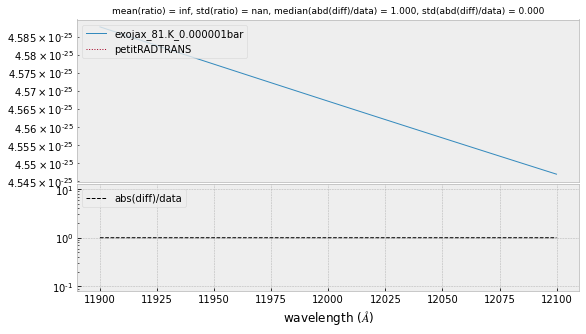

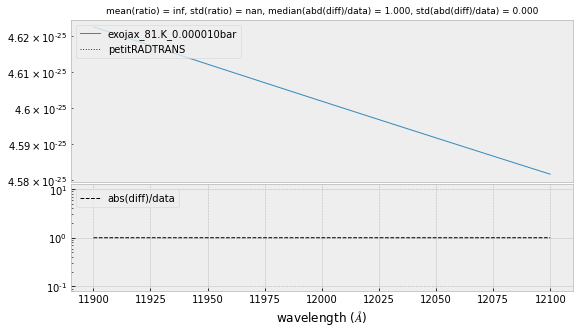

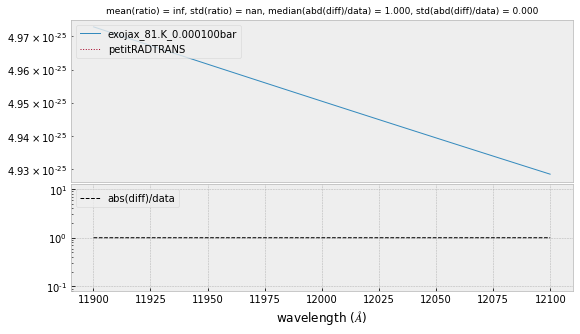

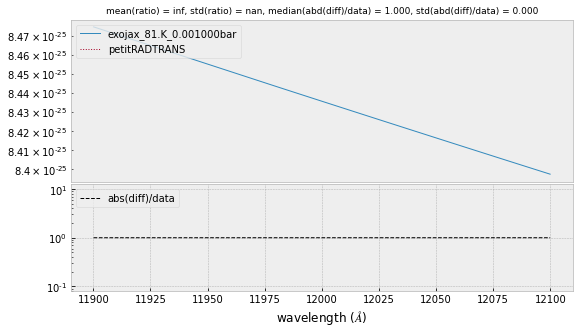

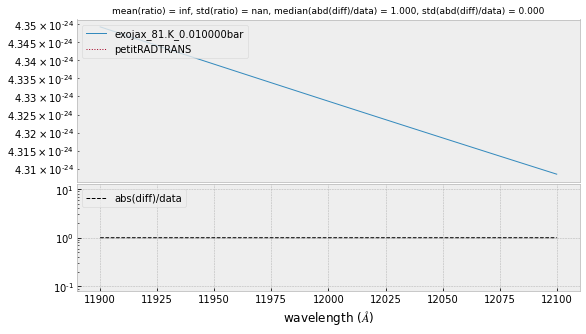

...

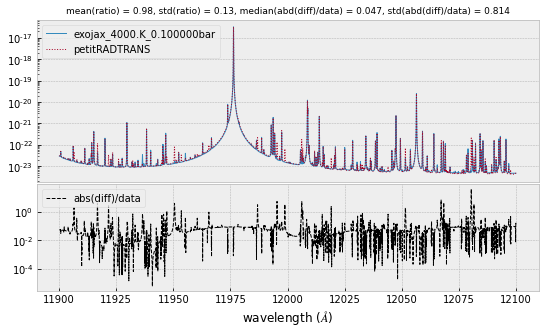

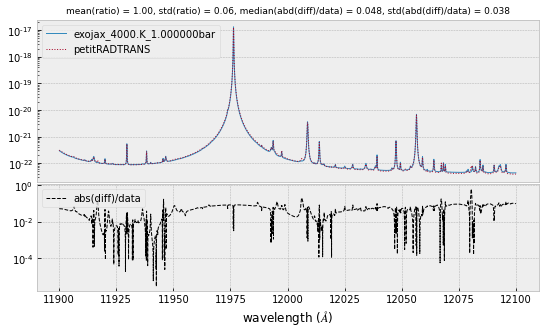

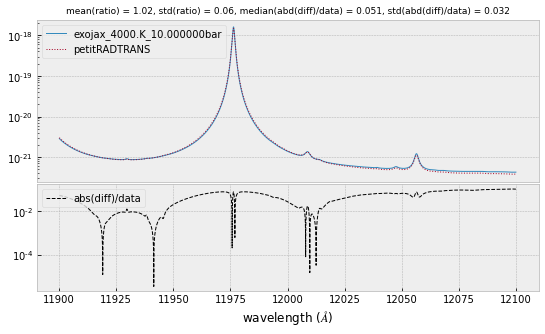

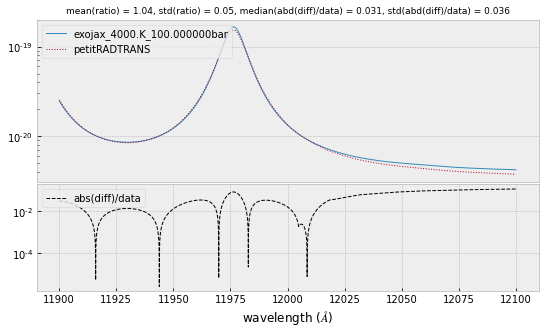

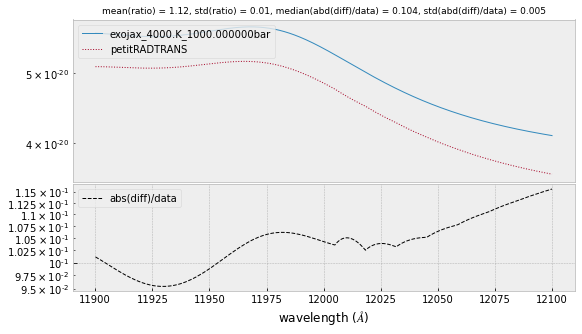

In [7]:
#Make a log file
logf = open(path_fig+'opacity_Fe_VALD3.log', 'w')


#Make a file of wavelength [cm]
np.array(1.0/nus[::-1], dtype=np.float64).tofile(outdir+"wlen"+out_suffix+".dat")


#each set of T & P
for T in Tarr:
    for P in Parr:
        PH = P* H_He_HH_VMR[0]
        PHe = P* H_He_HH_VMR[1]
        PHH = P* H_He_HH_VMR[2]

        
        
        #Make files of opacity [cm^2]        
        qt = np.ones_like(adbFe.A) * np.float32(adbFe.qr_interp("Fe 1", T))
        #↑Unlike the case of HITRAN (using Qr_HAPI), we ignored the isotopes.
        Sij = SijT(T, adbFe.logsij0, adbFe.nu_lines, adbFe.elower, qt)
        sigmaD = doppler_sigma(adbFe.nu_lines, T, Amol)
        gammaL = atomll.gamma_vald3(T, PH, PHH, PHe, adbFe.ielem, adbFe.iion, \
                adbFe.dev_nu_lines, adbFe.elower, adbFe.eupper, adbFe.atomicmass, adbFe.ionE, \
                adbFe.gamRad, adbFe.gamSta, adbFe.vdWdamp, enh_damp=1.0)
        xsv = xsection(nus, nu0, sigmaD, gammaL, Sij, memory_size=30) #←Bottleneck
        out = "sigma_99_"+("{:.0f}".format(T))+".K_"+("{:.6f}".format(P))+"bar"+out_suffix+".dat"
        op = np.array(xsv[::-1],dtype=np.float64)/(Amol*m_u)
        op.tofile(outdir+out)

        

        #Read spectra of exojax
        petit_exojaxdir = path_pRT+"input_data/opacities/lines/line_by_line/Fe_exojax/"
        species_mass = Amol

        with open(petit_exojaxdir+"wlen"+out_suffix+".dat", 'rb') as w:
            wav_exo=np.array(  np.fromfile(w, dtype=np.float64)  , dtype=np.float64) #[cm]

        fn_exo = "sigma_99_"+("{:.0f}".format(T))+".K_"+("{:.6f}".format(P))+"bar"+out_suffix+".dat"
        with open(petit_exojaxdir+fn_exo, 'rb') as f:
            xs_exo = np.array(  np.fromfile(f, dtype=np.float64)  )*species_mass*m_u


            
        #Read spectra of petitRADTRANS
        petitdir = path_pRT+"input_data/opacities/lines/line_by_line/Fe/"
        species_mass = Amol

        with open (petitdir+"wlen.dat") as w:
            wav_prt=np.array(  np.fromfile(w, dtype=np.float64)  , dtype=np.float64) #[cm]

        fn_prt = "sigma_99_"+("{:.0f}".format(T))+".K_"+("{:.6f}".format(P))+"bar.dat"
        with open(petitdir+fn_prt, 'rb') as f:
            xs_prt = np.array(  np.fromfile(f, dtype=np.float64)  )*species_mass*m_u


            
        #Trim and Interpolate spectra (as preparation for taking residuals)
        import scipy as sp
        from matplotlib import gridspec

        x1, y1 = wav_exo*1.e8,  xs_exo
        x2, y2 = wav_prt*1.e8,  xs_prt

        x1t_min = max(min(x1), min(x2))
        x1t_max = min(max(x1), max(x2))
        x1t = x1[np.where(x1-x1t_min >= 0)[0][0]+10 : np.where(x1-x1t_max <= 0)[0][-1]-10]
        y1t = y1[np.where(x1-x1t_min >= 0)[0][0]+10 : np.where(x1-x1t_max <= 0)[0][-1]-10]
        x2t = x2[np.where(x2-x1t_min >= 0)[0][0] : np.where(x2-x1t_max <= 0)[0][-1]]
        y2t = y2[np.where(x2-x1t_min >= 0)[0][0] : np.where(x2-x1t_max <= 0)[0][-1]]

        y2t_interp = sp.interpolate.interp1d(x2t, y2t, kind="quadratic")(x1t)

        

        #Plot and Examine normalized residuals
        fig = plt.figure(figsize=(9, 5))
        gs = gridspec.GridSpec(5,1)
        ax1 = plt.subplot(gs[0:3])
        ax2 = plt.subplot(gs[3:], sharex=ax1)

        idparam = "_"+("{:.0f}".format(T))+".K_"+("{:.6f}".format(P))+"bar"

        ax1.plot(x1t, y1t, '-', lw=1, label='exojax' + idparam)
        ax1.plot(x1t, y2t_interp, ':', lw=1, label='petitRADTRANS') #, alpha=.7) #, color='mediumseagreen'
        ax1.set_yscale("log")

        #---------------------------------------------------------------------------------
        #case(1)
        #ax2.plot(x1t, (y1t-y2t_interp), '--', lw=1, color='k', label='residual')

        #case(2)
        #ax2.plot(x1t, (y1t/y2t_interp), '--', lw=1, color='k', label='ratio')
        #ax2.set_yscale("log")

        #case(3)
        ax2.plot(x1t, abs(y1t-y2t_interp)/y1t, '--', lw=1, color='k', label='abs(diff)/data')
        ax2.set_yscale("log")
        #---------------------------------------------------------------------------------

        ratio = y1t/y2t_interp
        diffmax = np.max(abs(y1t-y2t_interp))
        normalized_residual = abs(y1t-y2t_interp)/y1t
        ax1.set_title('mean(ratio) = ' + str("{:.2f}".format(np.mean(ratio))) + \
                    ', std(ratio) = ' + str("{:.2f}".format(np.std(ratio))) + \
                    ', median(abd(diff)/data) = '+str("{:.3f}".format(np.median(normalized_residual))) + \
                    ', std(abd(diff)/data) = '+str("{:.3f}".format(np.std(normalized_residual))),  fontsize=9)
                    #', max(abd(diff)) = '+str("{:.1e}".format(diffmax)) + \
                    #', max(diff/data) = '+str("{:.1e}".format(np.max(normalized_residual))))
        ax1.axes.xaxis.set_visible(False)
        ax2.set_xlabel("wavelength ($\AA$)")
        plt.subplots_adjust(hspace=.05)
        ax1.legend(loc='upper left')
        ax2.legend(loc='upper left')

        opfigname = 'comp_diff_Fe_pRT'+idparam+'.pdf'
        plt.savefig(path_fig+opfigname)#_ratio
        print(opfigname)

        

        #Mension the cases where the differences are large
        crit_median = 0.1
        cirt_std = 50. #5.
        if (np.median(normalized_residual) > crit_median):
            logf.write('\n'+opfigname+'\t(1)'+ \
                      '\n\tmedian(abd(diff)/data) = '+str("{:.3f}".format(np.median(normalized_residual))) + \
                      '\n\tstd(abd(diff)/data) = '+str("{:.3f}".format(np.std(normalized_residual))))
        elif (np.std(normalized_residual) > cirt_std): 
            logf.write('\n'+opfigname+'\t(2)'+ \
                      '\n\tmedian(abd(diff)/data) = '+str("{:.3f}".format(np.median(normalized_residual))) + \
                      '\n\tstd(abd(diff)/data) = '+str("{:.3f}".format(np.std(normalized_residual))))
        
logf.close()